# Quick Notes

Author Information:
* JianKai Wang (https://jiankaiwang.no-ip.biz/)
* github: https://github.com/jiankaiwang


# Download Datasets

In [1]:
%cd /tmp
!mkdir -p /tmp/voc2012/tfrecords
!ls -al
%cd /tmp/voc2012

/tmp
total 12
drwxrwxrwt 1 root root 4096 Aug 22 14:59 .
drwxr-xr-x 1 root root 4096 Aug 22 14:58 ..
drwxr-xr-x 3 root root 4096 Aug 22 14:59 voc2012
/tmp/voc2012


In [2]:
!pip install -U -q PyDrive

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
gdrive = GoogleDrive(gauth)

     |████████████████████████████████| 993kB 5.1MB/s 


The following downloading command would cost lots of time.
We download the entire voc2012 compressed file.

In [3]:
%cd /tmp/voc2012
downloaded = gdrive.CreateFile({'id': "1-2EvfSbKC8xiejD-_kgCkRmn3fI7AzLa"}) 
downloaded.GetContentFile('voc2012.tar')  

/tmp/voc2012


In [0]:
!tar -xf voc2012.tar

We download the pre-generated tfrecords.

In [5]:
%cd /tmp/voc2012/tfrecords
downloaded = gdrive.CreateFile({'id': "1S-u7MXNiG3InPUSg2rUxWTnPTtYFomHd"}) 
downloaded.GetContentFile('train.tfrecords')  
downloaded = gdrive.CreateFile({'id': "1thiwOD42e1xJPPkDMkGzIR0TiH7RPG4_"}) 
downloaded.GetContentFile('test.tfrecords')  
downloaded = gdrive.CreateFile({'id': "1ClEuAvZrvrw8_X7pvV-malmbKEJ1zXZm"}) 
downloaded.GetContentFile('image_label.pbtxt')  

/tmp/voc2012/tfrecords


In [6]:
!ls -l /tmp/voc2012

total 1952788
drwxr-xr-x 2 root root       4096 Aug 22 15:04 tfrecords
-rw-r--r-- 1 root root 1999639040 Aug 22 15:00 voc2012.tar
drwxrwxrwx 3 root root       4096 May 11  2012 VOCdevkit


In [7]:
%cd /tmp/voc2012/VOCdevkit/VOC2012/ImageSets/Main
downloaded = gdrive.CreateFile({'id': "1wajMejvrzZjc0sM6M2-khmI1D2bWvAZD"}) 
downloaded.GetContentFile('train_set1.txt')  
downloaded = gdrive.CreateFile({'id': "14wtbRF1qZqkYDPvVzp-qmfL0NwAAbiQ7"}) 
downloaded.GetContentFile('val_set1.txt')  
downloaded = gdrive.CreateFile({'id': "1MzMS9NIC6f6Ev2fXib7WtTzOSds1FxPL"}) 
downloaded.GetContentFile('test_set1.txt')  

/tmp/voc2012/VOCdevkit/VOC2012/ImageSets/Main


# Environment Settings

In [0]:
!pip install tensorflow-gpu==1.14.0

## Cloning Necessary Repo

In [0]:
%cd /tmp
!git clone https://github.com/tensorflow/models.git

## Installing COCO API

In [0]:
!git clone https://github.com/cocodataset/cocoapi.git
%cd cocoapi/PythonAPI
!make
!cp -r pycocotools /tmp/models/research/

## Protobuf Compilation

In [0]:
%cd /tmp
!wget -O protobuf.zip https://github.com/google/protobuf/releases/download/v3.0.0/protoc-3.0.0-linux-x86_64.zip 
!unzip protobuf.zip -d protobuf
!rm -f protobuf.zip
!rm -f /usr/bin/protoc
!ln -s /tmp/protobuf/bin/protoc /usr/bin/protoc

In [12]:
%cd /tmp/models/research/
!protoc object_detection/protos/*.proto --python_out=.

/tmp/models/research


## Setup PYTHONPATH

In [13]:
import os
os.environ['PYTHONPATH'] += ":/tmp/models/research:/tmp/models/research/slim"
!echo $PYTHONPATH

/env/python:/tmp/models/research:/tmp/models/research/slim


In [14]:
os.sys.path += ["/tmp/models/research", "/tmp/models/research/slim"]
os.sys.path

['',
 '/env/python',
 '/usr/lib/python36.zip',
 '/usr/lib/python3.6',
 '/usr/lib/python3.6/lib-dynload',
 '/usr/local/lib/python3.6/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/usr/local/lib/python3.6/dist-packages/IPython/extensions',
 '/root/.ipython',
 '/tmp/models/research',
 '/tmp/models/research/slim']

## Importing Libraries

In [0]:
%cd /tmp/models/research/

import os
from absl import flags
import tensorflow as tf
from object_detection import model_hparams
from object_detection import model_lib
from object_detection.utils import dataset_util
from google.colab import drive
import xml.dom.minidom
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import codecs
import shutil

%matplotlib inline

print("Tensorflow Version: {}".format(tf.__version__))

In [0]:
drive.mount("/content/gdrive")

# Data Preparation

## Preparing TFRecords

In [17]:
labels_to_id = {"person":0, "bird":1, "cat":2, "cow":3, "dog":4, "horse":5, 
               "sheep":6, "aeroplane":7, "bicycle":8, "boat":9, "bus":10, 
               "car":11, "motorbike":12, "train":13, "bottle":14, "chair":15, 
               "diningtable":16, "pottedplant":17, "sofa":18, 
               "tvmonitor":19, "tv":19, "monitor":19}

id_to_labels = {}
for k, v in labels_to_id.items():
  id_to_labels[v] = k
  
print(labels_to_id)
print(id_to_labels)

{'person': 0, 'bird': 1, 'cat': 2, 'cow': 3, 'dog': 4, 'horse': 5, 'sheep': 6, 'aeroplane': 7, 'bicycle': 8, 'boat': 9, 'bus': 10, 'car': 11, 'motorbike': 12, 'train': 13, 'bottle': 14, 'chair': 15, 'diningtable': 16, 'pottedplant': 17, 'sofa': 18, 'tvmonitor': 19, 'tv': 19, 'monitor': 19}
{0: 'person', 1: 'bird', 2: 'cat', 3: 'cow', 4: 'dog', 5: 'horse', 6: 'sheep', 7: 'aeroplane', 8: 'bicycle', 9: 'boat', 10: 'bus', 11: 'car', 12: 'motorbike', 13: 'train', 14: 'bottle', 15: 'chair', 16: 'diningtable', 17: 'pottedplant', 18: 'sofa', 19: 'monitor'}


In [0]:
voc2012_datapath = "/tmp/voc2012/VOCdevkit/VOC2012"
outputFilePath = "/tmp/voc2012/tfrecords"
outputLabelFile = os.path.join(outputFilePath, 'image_label.pbtxt')
outputTrainTFRecordFile = os.path.join(outputFilePath, 'train.tfrecords')
outputTestTFRecordFile = os.path.join(outputFilePath, 'test.tfrecords')

assert os.path.exists(voc2012_datapath) and os.path.exists(outputLabelFile) \
  and os.path.exists(outputTrainTFRecordFile) and os.path.exists(outputTestTFRecordFile), "Necessary files were not found."

### Helpers

In [0]:
class EXAMPLE:
  height = 0
  width = 0
  filename = ""
  image_format = b'jpg'
  xmins = []
  xmaxs = []
  ymins = []
  ymaxs = []
  classes_text = []
  classes = []

In [0]:
def create_tf_example(example, imgInByte):
  height = example.height # Image height
  width = example.width # Image width
  filename = example.filename # Filename of the image. Empty if image is not from file
  encoded_image_data = imgInByte # Encoded image bytes
  image_format = example.image_format # b'jpeg' or b'png'
  
  xmins = example.xmins # List of normalized left x coordinates in bounding box (1 per box)
  xmaxs = example.xmaxs # List of normalized right x coordinates in bounding box (1 per box)
  ymins = example.ymins # List of normalized top y coordinates in bounding box (1 per box)
  ymaxs = example.ymaxs # List of normalized bottom y coordinates in bounding box (1 per box)
  classes_text = example.classes_text # List of string class name of bounding box (1 per box)
  classes = example.classes # List of integer class id of bounding box (1 per box)

  tf_example = tf.train.Example(features=tf.train.Features(feature={\
  'image/height': dataset_util.int64_feature(height) \
  , 'image/width': dataset_util.int64_feature(width) \
  , 'image/filename': dataset_util.bytes_feature(filename) \
  , 'image/source_id': dataset_util.bytes_feature(filename) \
  , 'image/encoded': dataset_util.bytes_feature(encoded_image_data) \
  , 'image/format': dataset_util.bytes_feature(image_format) \
  , 'image/object/bbox/xmin': dataset_util.float_list_feature(xmins) \
  , 'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs) \
  , 'image/object/bbox/ymin': dataset_util.float_list_feature(ymins) \
  , 'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs) \
  , 'image/object/class/text': dataset_util.bytes_list_feature(classes_text) \
  , 'image/object/class/label': dataset_util.int64_list_feature(classes) \
  }))
  return tf_example

In [0]:
def writePbtxt(outputLabelFile):
  global id_to_labels
  with codecs.open(outputLabelFile, 'w', 'utf-8') as fout:
    for idx in range(0, len(id_to_labels), 1):
      fout.write("item {\r\n  id: " + str(idx + 1) \
              + '\r\n  name: \'' + id_to_labels[idx] + "\'\r\n}\r\n")

In [0]:
def parseExampleObject(img_height, img_width, filename, fileformat, 
    xmins, xmaxs, ymins, ymaxs, classes_text, classes):
  egObj = EXAMPLE()
  egObj.height = img_height
  egObj.width = img_width
  egObj.filename = filename
  egObj.image_format = fileformat
  egObj.xmins = xmins
  egObj.xmaxs = xmaxs
  egObj.ymins = ymins
  egObj.ymaxs = ymaxs
  egObj.classes_text = classes_text
  egObj.classes = classes     
  return egObj

In [0]:
def getImgEncode(fileName):  
  global voc2012_datapath
  img_path = os.path.join(voc2012_datapath, "JPEGImages", fileName)

  # you have to use tf.gfile.FastGFile to encode
  # or error message: [Unable to decode bytes as JPEG, PNG, GIF, or BMP]
  image_data = tf.gfile.FastGFile(img_path, 'rb').read()
  return image_data

In [0]:
def prepare_split_datasets(dataset):
  """Prepare train and test datasets."""
  global id_to_labels, labels_to_id

  ret_list = []

  for img_id in dataset:
    anns_file = os.path.join("{}/Annotations/{}.xml".format(voc2012_datapath, img_id))
    DomTree = xml.dom.minidom.parse(anns_file)
    annotation = DomTree.documentElement
    filenamelist = annotation.getElementsByTagName('filename')
    filename = filenamelist[0].childNodes[0].data
    fileformat = filename.split('.')[1]
    image_width = annotation.getElementsByTagName('width')
    image_height = annotation.getElementsByTagName('height')
    image_width = float(image_width[0].childNodes[0].data)
    image_height = float(image_height[0].childNodes[0].data)   

    objectlist = annotation.getElementsByTagName('object')

    xmins = []
    xmaxs = []
    ymins = []
    ymaxs = []
    classes_text = []
    classes = []   

    for objects in objectlist:
      namelist = objects.getElementsByTagName('name')
      objectname = namelist[0].childNodes[0].data  # category
      bndbox = objects.getElementsByTagName('bndbox')
      
      for box in bndbox:
        x1_list = box.getElementsByTagName('xmin')
        x1 = int(x1_list[0].childNodes[0].data)
        y1_list = box.getElementsByTagName('ymin')
        y1 = int(y1_list[0].childNodes[0].data)
        x2_list = box.getElementsByTagName('xmax')
        x2 = int(x2_list[0].childNodes[0].data)
        y2_list = box.getElementsByTagName('ymax')
        y2 = int(y2_list[0].childNodes[0].data)

        # feed the normalized value into list
        x1 = float(x1) / image_width
        x2 = float(x2) / image_width
        y1 = float(y1) / image_height
        y2 = float(y2) / image_height
        xmins.append(x1)
        xmaxs.append(x2)
        ymins.append(y1)
        ymaxs.append(y2)

        # unify the label name
        unified_category = id_to_labels[labels_to_id[objectname]]
        classes_text.append(str.encode(unified_category))
        classes.append(labels_to_id[objectname])

    # save by each images
    ret_list.append(
      create_tf_example(
          parseExampleObject(int(image_height), 
                             int(image_width), 
                             str.encode(filename), 
                             str.encode(fileformat), 
                             xmins, 
                             xmaxs, 
                             ymins, 
                             ymaxs, 
                             classes_text, 
                             classes)
          , getImgEncode(filename)
      )
    )

  return ret_list

In [0]:
def getFList(file):
  """Preprocess the VOC annotation files.
  Returns:
    fList: a list conserving the whole image IDs
  """
  fList = []
  with open(file, "r") as fin:
    for line in fin:
      tmp = line.strip().split(' ')
      fList.append(tmp[0])
  return fList

### Generating Train / Test TFRecords

In [26]:
dataDir="/tmp/voc2012/VOCdevkit/VOC2012"
train_file_list = "{}/ImageSets/Main/{}".format(dataDir, "train_set1.txt")
val_file_list = "{}/ImageSets/Main/{}".format(dataDir, "val_set1.txt")
test_file_list = "{}/ImageSets/Main/{}".format(dataDir, "test_set1.txt")

if os.path.exists(train_file_list) and os.path.exists(val_file_list) and os.path.exists(test_file_list):
  print("Use pre-generated splited datasets.")
  train_split = getFList(train_file_list)
  val_split = getFList(val_file_list)
  test_split = getFList(test_file_list)
else:
  print("Generate splited datasets.")
  train_file = "{}/ImageSets/Main/{}".format(dataDir, "train.txt")
  val_file = "{}/ImageSets/Main/{}".format(dataDir, "val.txt")

  train_list = getFList(train_file)
  val_list = getFList(val_file)
  print("Train num: {}, Val num: {}".format(len(train_list), len(val_list)))

  total_list = train_list + val_list
  np.random.shuffle(total_list)

  ratio_list = {"train":0.8, "val":0.1, "test":0.1}
  train_index = int(np.floor(len(total_list) * ratio_list["train"]))
  val_index = train_index + int(np.floor(len(total_list) * ratio_list["val"]))

  train_split = total_list[:train_index]
  val_split = total_list[train_index:val_index]
  test_split = total_list[val_index:]

  with open(train_file_list, "w") as fout:
    for item in train_split:
      fout.write(str(item) + "\n")

  with open(val_file_list, "w") as fout:
    for item in val_split:
      fout.write(str(item) + "\n")

  with open(test_file_list, "w") as fout:
    for item in test_split:
      fout.write(str(item) + "\n")        
    
print("Train split: {}, Val split: {}, Test split: {}".format(
    len(train_split), len(val_split), len(test_split)))  

Use pre-generated splited datasets.
Train split: 9232, Val split: 1154, Test split: 1154


In [27]:
over_write = False

if (not os.path.exists(outputTrainTFRecordFile) or not os.path.exists(outputTestTFRecordFile)) or over_write:
  print("Generated training tfrecords.")
  trainLabels = prepare_split_datasets(train_split + val_split)
  print("Generated testing tfrecords.")
  testLabels = prepare_split_datasets(test_split)

  print("Write out training tfrecords at {}.".format(outputTrainTFRecordFile))
  with tf.python_io.TFRecordWriter(outputTrainTFRecordFile) as writer:
    for i in range(0, len(trainLabels), 1):
        writer.write(trainLabels[i].SerializeToString())
  
  print("Write out testing tfrecords at {}.".format(outputTestTFRecordFile))
  with tf.python_io.TFRecordWriter(outputTestTFRecordFile) as writer:
    for i in range(0, len(testLabels), 1):
        writer.write(testLabels[i].SerializeToString())
else:
  print("Used pre-generated tfrecords.")

Used pre-generated tfrecords.


## Checking TFRecords Available

In [0]:
def read_and_decode(filename_queue):
  # create a tfrecord object
  reader = tf.TFRecordReader()
  _, serialized_example = reader.read(filename_queue)
  
  # decode the example
  features = tf.parse_single_example(
      serialized_example,
      features={'image/encoded':tf.FixedLenFeature([], tf.string)
      , 'image/object/class/label':tf.VarLenFeature(tf.int64)
      , 'image/object/bbox/xmin':tf.VarLenFeature(tf.float32)
      , 'image/object/bbox/xmax':tf.VarLenFeature(tf.float32)
      , 'image/object/bbox/ymin':tf.VarLenFeature(tf.float32)
      , 'image/object/bbox/ymax':tf.VarLenFeature(tf.float32)
      , 'image/height':tf.FixedLenFeature([], tf.int64) 
      , 'image/width':tf.FixedLenFeature([], tf.int64)})
  
  label = tf.cast(features['image/object/class/label'], tf.int64)
  label = tf.sparse_tensor_to_dense(label)
  xmin = tf.cast(features['image/object/bbox/xmin'], tf.float32)
  xmin = tf.sparse_tensor_to_dense(xmin)
  xmax = tf.cast(features['image/object/bbox/xmax'], tf.float32)
  xmax = tf.sparse_tensor_to_dense(xmax)
  ymin = tf.cast(features['image/object/bbox/ymin'], tf.float32)
  ymin = tf.sparse_tensor_to_dense(ymin)
  ymax = tf.cast(features['image/object/bbox/ymax'], tf.float32)
  ymax = tf.sparse_tensor_to_dense(ymax)
  height = tf.cast(features['image/height'], tf.int64)
  width = tf.cast(features['image/width'], tf.int64)
  
  # it must decode byteslist from string type to uint8 type
  image = tf.image.decode_jpeg(features['image/encoded'])
  image = tf.image.convert_image_dtype(image, dtype=tf.uint8)
  return image, height, width, label, xmin, xmax, ymin, ymax

In [0]:
def inputs(tfrecords, num_epochs=None):
  # return a QueueRunner object and FIFOQueue object inside in
  filename_queue = tf.train.string_input_producer([tfrecords], num_epochs=num_epochs)
  image, height, width, label, xmin, xmax, ymin, ymax = read_and_decode(filename_queue)
  
  with tf.Session() as sess:
    # because one epoch variable is built inside string_input_produer (image_raw)
    # and the variable is belonging to tf.GraphKeys.LOCAL_VARIABLES
    # tf.local_variables_initializer() is necessary
    init_op = tf.group(tf.global_variables_initializer(), tf.local_variables_initializer())
    sess.run(init_op)
    
    coord=tf.train.Coordinator()
    threads= tf.train.start_queue_runners(coord=coord)
    
    for i in range(0, 11, 1):
      single, heg, wdt, lbl, xin, xmn, yin, ymn = \
        sess.run([image, height, width, label, xmin, xmax, ymin, ymax])

      # show the image
      fig, ax = plt.subplots(1, 1, figsize=(6,6))
      ax.imshow(single)
      for obj in range(0, len(lbl), 1):
        # draw object
        rect = patches.Rectangle(
          (xin[obj] * wdt, yin[obj] * heg),
          (xmn[obj] - xin[obj]) * wdt, (ymn[obj] - yin[obj]) * heg,
          linewidth=2,
          edgecolor='r',
          facecolor='none')
        ax.add_patch(rect)
        # add text
        category_name = id_to_labels[lbl[obj]]
        plt.text((xmn[obj] + xin[obj]) / 2.0 * wdt, 
                 (ymn[obj] + yin[obj]) / 2.0 * heg, 
                 category_name, 
                 fontdict=dict(fontsize=12, color='w'), 
                 bbox=dict(facecolor='w', alpha=0.1))
      fig.show()
      
      # print the label
      print("Image height:{}, width:{}, label:{}, xmin:{}, xmax:{}, ymin:{}, ymax:{}.".format(
          heg, wdt, lbl, xin, xmn, yin, ymn))
        
    coord.request_stop()
    coord.join(threads) 

W0822 15:11:18.069923 140556381022080 deprecation.py:323] From <ipython-input-29-605c8d0fda3a>:3: string_input_producer (from tensorflow.python.training.input) is deprecated and will be removed in a future version.
Instructions for updating:
Queue-based input pipelines have been replaced by `tf.data`. Use `tf.data.Dataset.from_tensor_slices(string_tensor).shuffle(tf.shape(input_tensor, out_type=tf.int64)[0]).repeat(num_epochs)`. If `shuffle=False`, omit the `.shuffle(...)`.
W0822 15:11:18.089701 140556381022080 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/training/input.py:278: input_producer (from tensorflow.python.training.input) is deprecated and will be removed in a future version.
Instructions for updating:
Queue-based input pipelines have been replaced by `tf.data`. Use `tf.data.Dataset.from_tensor_slices(input_tensor).shuffle(tf.shape(input_tensor, out_type=tf.int64)[0]).repeat(num_epochs)`. If `shuffle=False`, omit the `.shuffle(...)`.
W0822

Image height:375, width:500, label:[7], xmin:[0.106], xmax:[1.], ymin:[0.19733334], ymax:[0.70933336].
Image height:375, width:500, label:[4 4], xmin:[0.594 0.092], xmax:[0.844 0.368], ymin:[0.20533334 0.21866667], ymax:[0.85066664 0.736     ].
Image height:375, width:500, label:[4 0 0], xmin:[0.502 0.638 0.34 ], xmax:[0.658 0.896 0.526], ymin:[0.5973333  0.18933333 0.34933335], ymax:[0.73866665 0.936      0.93866664].
Image height:360, width:500, label:[17], xmin:[0.004], xmax:[0.982], ymin:[0.10555556], ymax:[1.].
Image height:500, width:375, label:[0 0], xmin:[0.11733333 0.00266667], xmax:[0.8986667 0.424    ], ymin:[0.042 0.062], ymax:[1. 1.].
Image height:375, width:500, label:[12  0  0  0  0], xmin:[0.528 0.552 0.842 0.93  0.602], xmax:[0.704 0.654 0.942 0.972 0.64 ], ymin:[0.608      0.50666666 0.73866665 0.67733335 0.8       ], ymax:[0.792      0.70133334 1.         0.856      0.85333335].
Image height:334, width:500, label:[7], xmin:[0.016], xmax:[0.832], ymin:[0.24550898], ym

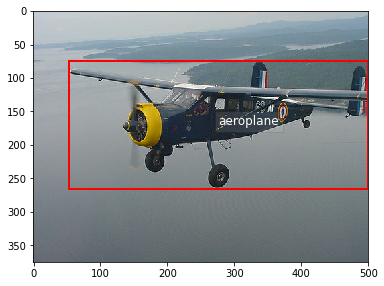

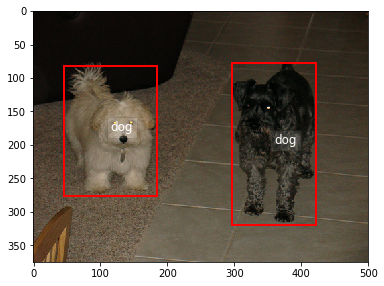

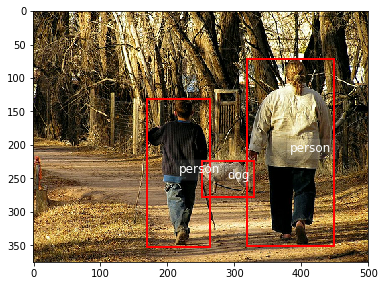

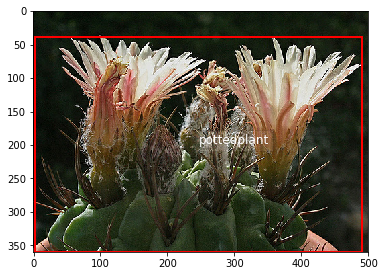

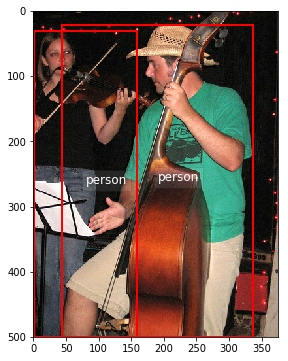

...

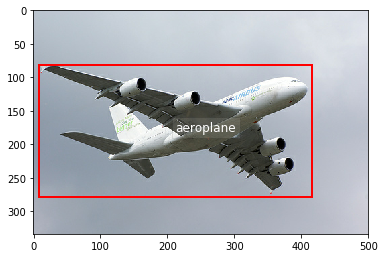

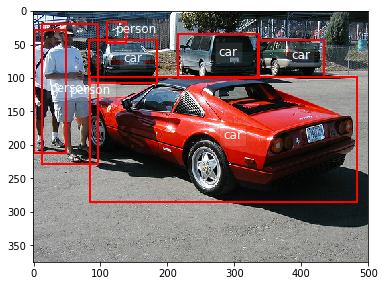

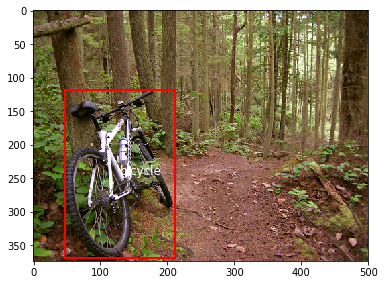

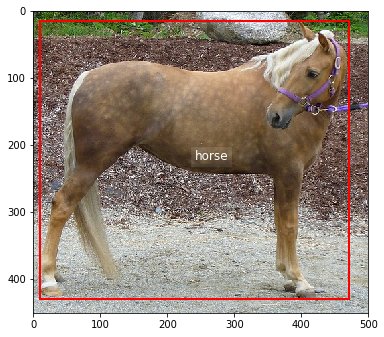

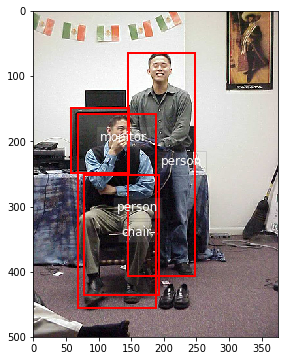

In [30]:
if os.path.exists(outputTestTFRecordFile):
  inputs(outputTestTFRecordFile)

## Preparing Label Files

In [31]:
if not os.path.exists(outputLabelFile):
  print("Generated a new label file.")
  writePbtxt(outputLabelFile)
else:
  print("Use pre-generated label file at {}.".format(outputLabelFile))

Use pre-generated label file at /tmp/voc2012/tfrecords/image_label.pbtxt.


# Training

## Preparing a Pipeline Configure

In [0]:
from google.protobuf import text_format
from object_detection.utils import config_util
from object_detection.utils import label_map_util

Create a model directory on your own google drive space for saving training material.

In [33]:
!mkdir -p /content/gdrive/My\ Drive/model_output/FasterRCNN/model_dir
%cd /tmp/models/research/

/tmp/models/research


### Helpers

In [0]:
def lastestCheckpoint(CKPT_PATH):
  """
  description: Get the latest checkpoint path from a training folder.
  input:
      CKPT_PATH: the folder path
  """
  latest_ckpt = tf.train.latest_checkpoint(CKPT_PATH)
  return "{}".format(latest_ckpt)

In [0]:
def getConfigFromPipeline(PIPELINE_PATH):
  try:
    content = config_util.get_configs_from_pipeline_file(PIPELINE_PATH)
    return content, False
  except Exception as e:
    content = None
    print(str(e))
    return content, True

In [0]:
def getLabelFilePath(PIPELINE_PATH):
  """
  description: Get the label file path for training.
                It is the same with valid and inference in general.
  input:
      CKPT_PATH: the folder path
  """
  content = config_util.get_configs_from_pipeline_file(PIPELINE_PATH)
  return content["train_input_config"].ListFields()[0][1]

In [0]:
def getClassNumber(PIPELINE_PATH):
  content, err = getConfigFromPipeline(PIPELINE_PATH)
  if not err:
    try:
      return config_util.get_number_of_classes(content["model"]), False
    except Exception as e:
      return str(e), True
  else:
    return "Parsing configuration file is error.", True

In [0]:
def getNumberClassInLabelMap(LABLE_PATH):
  category_index = label_map_util.create_category_index_from_labelmap(\
    LABLE_PATH, use_display_name=True)
  return category_index

In [0]:
def set_num_class(LMAP_PATH, PIPE_PATH):
  number, err = getClassNumber(PIPE_PATH)
  
  if not err:
    try:
      data = getNumberClassInLabelMap(LMAP_PATH)
    except Exception as e:
      raise Exception(str(e))
      return "Parsing the label file is error.", True
  else:
    return "Parsing the config file is error.", True
  
  content, err = getConfigFromPipeline(PIPE_PATH)
  if number != len(data):
    if err: return "Parsing the configuration file is error.", True
    content["model"].faster_rcnn.num_classes = len(data)
  
  return content, False

In [0]:
def set_inputs_info(content, label_path, train_tfrecord_path, test_tfrecord_path):
  try:
    content['train_input_config'].label_map_path = label_path
    content['train_input_config'].tf_record_input_reader.input_path[0] = train_tfrecord_path
    content['eval_input_config'].label_map_path = outputLabelFile
    content['eval_input_config'].tf_record_input_reader.input_path[0] = test_tfrecord_path
    return content, False
  except Exception as e:
    return str(e), True

In [0]:
def set_finetune(content, ckpt_path):
  try:
    content['train_config'].fine_tune_checkpoint = ckpt_path
    return content, False
  except Exception as e:
    return str(e), True

In [0]:
def write_new_config(config, OUTPUT_PATH):
  """
  description: 
  input:
      config: a dict-based config
  """
  try:
    pipeline_config_msg = config_util.create_pipeline_proto_from_configs(config)    
    pipeline_config_final = text_format.MessageToString(pipeline_config_msg)
    with tf.gfile.Open(OUTPUT_PATH, "wb") as f:
      f.write(pipeline_config_final)
    return None, False
  except Exception as e:
    return str(e), True

### Model Selection

Here we use FasterRCNN with Inception V2 backbone as the example. More models can be selected from the website https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md.

In [44]:
%cd /tmp/
!rm -rf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz*
!wget http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!tar zxvf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
!rm -rf faster_rcnn_inception_v2_coco_2018_01_28.tar.gz*

/tmp
--2019-08-22 15:18:11--  http://download.tensorflow.org/models/object_detection/faster_rcnn_inception_v2_coco_2018_01_28.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.195.128, 2607:f8b0:400e:c08::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.195.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 149119618 (142M) [application/x-tar]
Saving to: ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’

faster_rcnn_incepti 100%[===================>] 142.21M   154MB/s    in 0.9s    

2019-08-22 15:18:12 (154 MB/s) - ‘faster_rcnn_inception_v2_coco_2018_01_28.tar.gz’ saved [149119618/149119618]

faster_rcnn_inception_v2_coco_2018_01_28/
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.index
faster_rcnn_inception_v2_coco_2018_01_28/checkpoint
faster_rcnn_inception_v2_coco_2018_01_28/pipeline.config
faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt.data-00000-of-00001
faster_rcnn_inception_v2_coco_2018_01_28

### Editing the Pipeline

In [45]:
LMAP_PATH = outputLabelFile
# use the sample config instead of the tar.gz from compressed file downloaded from model zoo
PIPE_PATH = "/tmp/models/research/object_detection/samples/configs/faster_rcnn_inception_v2_coco.config"
OUTPUT_PATH = "/content/gdrive/My Drive/model_output/FasterRCNN/pipeline.config"
content, err = set_num_class(LMAP_PATH, PIPE_PATH)
if err:
  raise Exception("Error in seting number of classes." + str(content))
content, err = set_inputs_info(content, outputLabelFile, outputTrainTFRecordFile, outputTestTFRecordFile)
if err:
  raise Exception("Error in replacing label or tfrecord files." + str(content))
content, err = set_finetune(content, "/tmp/faster_rcnn_inception_v2_coco_2018_01_28/model.ckpt")
if err:
  raise Exception("Error in editing ckpt path." + str(content))

msg, err = write_new_config(content, OUTPUT_PATH)
if err: 
  raise Exception("Error in writting out the config." + str(msg))
print("The new configure file was generated.")

W0822 15:19:21.685801 140556381022080 deprecation_wrapper.py:119] From /tmp/models/research/object_detection/utils/config_util.py:102: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.



The new configure file was generated.


## Starting Training

You don't need to do anything editing the following script. 

In [0]:
def start_training(
    model_dir, pipeline_config_path, num_train_steps, eval_training_data,
    sample_1_of_n_eval_examples, sample_1_of_n_eval_on_train_examples, 
    hparams_overrides, checkpoint_dir, run_once
  ):
  assert model_dir is not None, "Model dir is necessary."
  assert pipeline_config_path is not None, "Pipeline file is necessary."

  config = tf.estimator.RunConfig(model_dir=model_dir)

  train_and_eval_dict = model_lib.create_estimator_and_inputs(
      run_config=config,
      hparams=model_hparams.create_hparams(hparams_overrides),
      pipeline_config_path=pipeline_config_path,
      train_steps=num_train_steps,
      sample_1_of_n_eval_examples=sample_1_of_n_eval_examples,
      sample_1_of_n_eval_on_train_examples=(sample_1_of_n_eval_on_train_examples))
  estimator = train_and_eval_dict['estimator']
  train_input_fn = train_and_eval_dict['train_input_fn']
  eval_input_fns = train_and_eval_dict['eval_input_fns']
  eval_on_train_input_fn = train_and_eval_dict['eval_on_train_input_fn']
  predict_input_fn = train_and_eval_dict['predict_input_fn']
  train_steps = train_and_eval_dict['train_steps']

  if checkpoint_dir:
    if eval_training_data:
      name = 'training_data'
      input_fn = eval_on_train_input_fn
    else:
      name = 'validation_data'
      # The first eval input will be evaluated.
      input_fn = eval_input_fns[0]
    if run_once:
      estimator.evaluate(input_fn,
                        steps=None,
                        checkpoint_path=tf.train.latest_checkpoint(checkpoint_dir))
    else:
      model_lib.continuous_eval(estimator, checkpoint_dir, input_fn,
                                train_steps, name)
  else:
    train_spec, eval_specs = model_lib.create_train_and_eval_specs(
        train_input_fn,
        eval_input_fns,
        eval_on_train_input_fn,
        predict_input_fn,
        train_steps,
        eval_on_train_data=False)

    # Currently only a single Eval Spec is allowed.
    tf.estimator.train_and_evaluate(estimator, train_spec, eval_specs[0])

In [0]:
# path to output model where the checkpoint or the event files will be written
model_dir = "/content/gdrive/My Drive/model_output/FasterRCNN/model_dir"

# path to pipeline.config (meet your configure)
pipeline_config_path = OUTPUT_PATH

# the number of train steps
num_train_steps = 150000

# whether to evaluate the train dataset
# if this flag is True, the process would be only eval mode 
# and the `checkpoint_dir` flag must be available
eval_training_data = False

# will smaple one of every n eval input samples, where n is provided
sample_1_of_n_eval_examples = 100

# will sample one of every n train input samples, where n is provided
# this flag is available only when the flag `eval_training_data` is True
sample_1_of_n_eval_on_train_examples = 5

# Overrides the hyperparameter, that is represented as the string
# in the pair format like `hparam_name=value pairs`.
hparams_overrides = None

# path to the directory holding the checkpoints
checkpoint_dir = None

# if running in eval-only mode, whether to run just one round of eval 
# or running continuously
run_once = False

In [0]:
start_training(
    model_dir, pipeline_config_path, num_train_steps, eval_training_data,
    sample_1_of_n_eval_examples, sample_1_of_n_eval_on_train_examples, 
    hparams_overrides, checkpoint_dir, run_once
)

W0822 15:28:44.771675 140556381022080 deprecation_wrapper.py:119] From /tmp/models/research/object_detection/model_lib.py:616: The name tf.logging.warning is deprecated. Please use tf.compat.v1.logging.warning instead.

W0822 15:28:44.776517 140556381022080 model_lib.py:617] Forced number of epochs for all eval validations to be 1.
W0822 15:28:44.779242 140556381022080 model_lib.py:633] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
W0822 15:28:44.783761 140556381022080 model_fn.py:630] Estimator's model_fn (<function create_model_fn.<locals>.model_fn at 0x7fd4ff3a62f0>) includes params argument, but params are not passed to Estimator.
W0822 15:28:44.807223 140556381022080 deprecation.py:323] From /usr/local/lib/python3.6/dist-packages/tensorflow/python/training/training_util.py:236: Variable.initialized_value (from tensorflow.python.ops.variables) is deprecated and will be removed in a futu

### Starting a New Training via CLI

You can also use the command line to start a new train task.
```sh
cd ~/models/research
python object_detection/model_main.py \
    --pipeline_config_path=/<path>/pipeline.config \
    --model_dir=/<path>/<output-path>
```

## Monitoring Training Process

In [47]:
# magic function in colab
%load_ext tensorboard
%tensorboard --logdir "/content/gdrive/My Drive/model_output/FasterRCNN/model_dir"

## Output the Model

In [0]:
from google.protobuf import text_format
from object_detection import exporter
from object_detection.protos import pipeline_pb2

In [0]:
def export_model(
    input_type, input_shape, pipeline_config_path, trained_checkpoint_prefix, 
    output_directory, config_override, write_inference_graph
  ):
  """Export the model based on pipeline.config.
  The following script is abstract to you.
  You don't need to edit anything by default.
  """
  tf.reset_default_graph()
  pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
  with tf.gfile.GFile(pipeline_config_path, 'r') as f:
    text_format.Merge(f.read(), pipeline_config)
  text_format.Merge(config_override, pipeline_config)
  if input_shape:
    input_shape = [
        int(dim) if dim != '-1' else None
        for dim in input_shape.split(',')
    ]
  else:
    input_shape = None
  exporter.export_inference_graph(
      input_type, pipeline_config, trained_checkpoint_prefix,
      output_directory, input_shape=input_shape,
      write_inference_graph=write_inference_graph)
  print("Exporting model was complete.")

In [0]:
slim = tf.contrib.slim
input_type = "image_tensor"
input_shape = None
pipeline_config_path = "/content/gdrive/My Drive/model_output/FasterRCNN/pipeline.config"
trained_checkpoint_prefix = lastestCheckpoint(model_dir)
output_directory = "/content/gdrive/My Drive/model_output/FasterRCNN/model_output"
config_override = ''
write_inference_graph = False

In [53]:
if os.path.exists(output_directory):
  shutil.rmtree(output_directory, ignore_errors=True)
  print("Removing the previous version.")

export_model(input_type, input_shape, pipeline_config_path, trained_checkpoint_prefix, 
    output_directory, config_override, write_inference_graph)

W0822 15:25:21.013297 140556381022080 deprecation_wrapper.py:119] From /tmp/models/research/object_detection/exporter.py:381: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.

W0822 15:25:21.017034 140556381022080 deprecation_wrapper.py:119] From /tmp/models/research/object_detection/exporter.py:113: The name tf.placeholder is deprecated. Please use tf.compat.v1.placeholder instead.

W0822 15:25:21.067891 140556381022080 deprecation_wrapper.py:119] From /tmp/models/research/object_detection/core/preprocessor.py:2412: The name tf.image.resize_images is deprecated. Please use tf.image.resize instead.

W0822 15:25:21.126078 140556381022080 deprecation_wrapper.py:119] From /tmp/models/research/object_detection/meta_architectures/faster_rcnn_meta_arch.py:166: The name tf.variable_scope is deprecated. Please use tf.compat.v1.variable_scope instead.

W0822 15:25:21.140311 140556381022080 deprecation.py:506] From /usr/local/lib/python3.6/dist-packages/tensorfl

Exporting model was complete.


### Output the Model via CLI

```sh
cd ~/models/research
python object_detection/export_inference_graph.py \
    --input_type image_tensor \
    --pipeline_config_path ${DATA_PATH}/pipeline.config \
    --trained_checkpoint_prefix ${latest} \
    --output_directory ${TRAINED_PATH}
```

# Inference

In [0]:
import numpy as np
import re
from collections import OrderedDict

## Environment Settings

In [0]:
config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
config.allow_soft_placement = True
config.log_device_placement=True
config.gpu_options.per_process_gpu_memory_fraction = 0.1

In [0]:
RETRAINED_MODEL_PATH = "/content/gdrive/My Drive/model_output/FasterRCNN/model_output"
PATH_TO_PB = os.path.join(RETRAINED_MODEL_PATH, "frozen_inference_graph.pb")
PATH_TO_LABELS = outputLabelFile

if not os.path.exists(PATH_TO_PB): raise FileNotFoundError("PB is not found.")
if not os.path.exists(PATH_TO_LABELS): raise FileNotFoundError("Label is not found")

## Loading Frozen Model

In [0]:
detection_graph = tf.Graph()
with detection_graph.as_default():
  od_graph_def = tf.GraphDef()
  with tf.gfile.GFile(PATH_TO_PB, 'rb') as fid:
    serialized_graph = fid.read()
    od_graph_def.ParseFromString(serialized_graph)
    tf.import_graph_def(od_graph_def, name='')

## Listing All Operation Names

In [58]:
def show_operation_names(count=10):
  """
  Show all operation names in the graph, including "input(image_tensor)" 
  and "output(detection_boxes, detection_scores, detection_classes, num_detections)".
  """
  with detection_graph.as_default():
    with tf.Session(config=config) as sess:
      opts = tf.get_default_graph().get_operations()
      for opt in opts[:count]: 
        for output in opt.outputs: print(output.name)
      print("...")
      for opt in opts[-count:]: 
        for output in opt.outputs: print(output.name)
                    
show_operation_names(10)

image_tensor:0
Cast:0
Preprocessor/map/Shape:0
Preprocessor/map/strided_slice/stack:0
Preprocessor/map/strided_slice/stack_1:0
Preprocessor/map/strided_slice/stack_2:0
Preprocessor/map/strided_slice:0
Preprocessor/map/TensorArray:0
Preprocessor/map/TensorArray:1
Preprocessor/map/TensorArrayUnstack/Shape:0
Preprocessor/map/TensorArrayUnstack/strided_slice/stack:0
...
add/y:0
add:0
detection_boxes:0
detection_scores:0
detection_multiclass_scores:0
detection_features:0
detection_classes:0
num_detections:0
raw_detection_boxes:0
raw_detection_scores:0


## Loading Label File

In [59]:
category_index = OrderedDict()
with open(PATH_TO_LABELS, "r") as fin:
  tmpData = ""
  for line in fin:
    tmpData += line.strip()
  #print(tmpData)
  
  pattern = re.compile("item\s+\{id:\s+(\d*)name:\s+'([\d\S]*)'\}", re.I)
  allItems = pattern.findall(tmpData)
  for item_idx in range(len(allItems)):
    category_index[int(allItems[item_idx][0])] = {'id': int(allItems[item_idx][0]),
                                                  'name': str(allItems[item_idx][1])}
  print(category_index)

OrderedDict([(1, {'id': 1, 'name': 'person'}), (2, {'id': 2, 'name': 'bird'}), (3, {'id': 3, 'name': 'cat'}), (4, {'id': 4, 'name': 'cow'}), (5, {'id': 5, 'name': 'dog'}), (6, {'id': 6, 'name': 'horse'}), (7, {'id': 7, 'name': 'sheep'}), (8, {'id': 8, 'name': 'aeroplane'}), (9, {'id': 9, 'name': 'bicycle'}), (10, {'id': 10, 'name': 'boat'}), (11, {'id': 11, 'name': 'bus'}), (12, {'id': 12, 'name': 'car'}), (13, {'id': 13, 'name': 'motorbike'}), (14, {'id': 14, 'name': 'train'}), (15, {'id': 15, 'name': 'bottle'}), (16, {'id': 16, 'name': 'chair'}), (17, {'id': 17, 'name': 'diningtable'}), (18, {'id': 18, 'name': 'pottedplant'}), (19, {'id': 19, 'name': 'sofa'}), (20, {'id': 20, 'name': 'monitor'})])


## Inference

### Helpers

In [0]:
def inference_single_image(image, graph):
  """
  image `image_tensor`: data in type uint8 of shape [None, None, None, 3]
  graph: loaded from frozen model file
  `num_detections`: shape [batch] in float32, the number of valid box per images
  `detection_boxes`: shape [batch, box_number, 4] in float32, (ymin, xmin, ymax, xmax)
  `detection_scores`: shape [batch, box_number] in float32, class scores for each box detections
  `detection_classes`: shape [batch, box_number] in float32, classes for each box detections
  """
  with graph.as_default():
    with tf.Session(config=config) as sess:
      # handle input and output tensor
      opts = tf.get_default_graph().get_operations()
      all_tensorflow_names = { output.name for opt in opts for output in opt.outputs }
      tensor_dict = {}
      for key in ['num_detections', 'detection_boxes', 'detection_scores', 'detection_classes']:
          tensor_name = key + ':0'
          if tensor_name in all_tensorflow_names:
              tensor_dict[key] = tf.get_default_graph().get_tensor_by_name(tensor_name)
              
      # run for single image            
      # input
      image_tensor = tf.get_default_graph().get_tensor_by_name('image_tensor:0')
      
      # inference
      output_dict = sess.run(tensor_dict, feed_dict={image_tensor: np.expand_dims(image, 0)})
      
      # convert data type float32 to appropriate
      output_dict['num_detections'] = int(output_dict['num_detections'][0])
      output_dict['detection_classes'] = output_dict['detection_classes'][0].astype(np.uint8)
      output_dict['detection_boxes'] = output_dict['detection_boxes'][0]
      output_dict['detection_scores'] = output_dict['detection_scores'][0]
            
  return output_dict

In [0]:
def calculateCoord(imgPath, points):
  # (ymin, xmin, ymax, xmax)
  (h, w) = plt.imread(imgPath).shape[:2]
  y1, x1 = h * points[0], w * points[1]
  y2, x2 = h * points[2], w * points[3]
  return int(round(x1)), int(round(y1)), int(round(x2)), int(round(y2))

In [0]:
def showImage(imgPath, points, class_res):
  im = plt.imread(imgPath)
  
  fig,ax = plt.subplots(1, 1, figsize=(12,8))

  # Display the image
  ax.imshow(im)

  # Create a Rectangle patch
  for point in range(len(points)):
    rect = patches.Rectangle((points[point][0], points[point][1]),
                             points[point][2]- points[point][0],
                             points[point][3]- points[point][1],
                             linewidth=3,
                             edgecolor='red',
                             facecolor='none')
    
    # Add the patch to the Axes
    ax.add_patch(rect)
    ax.axis("off")
  
  for point in range(len(points)):
    x = points[point][0]
    y = points[point][1]
    s = "{}:{}".format(class_res[point][0], class_res[point][1])
    plt.text(x, y, s, fontdict=dict(fontsize=14, color='white'),
             bbox=dict(facecolor='white', alpha=0.1))
  
  plt.show()

### Inference Body

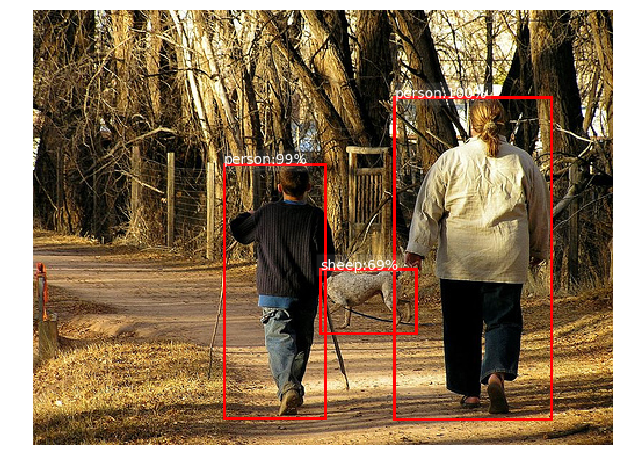

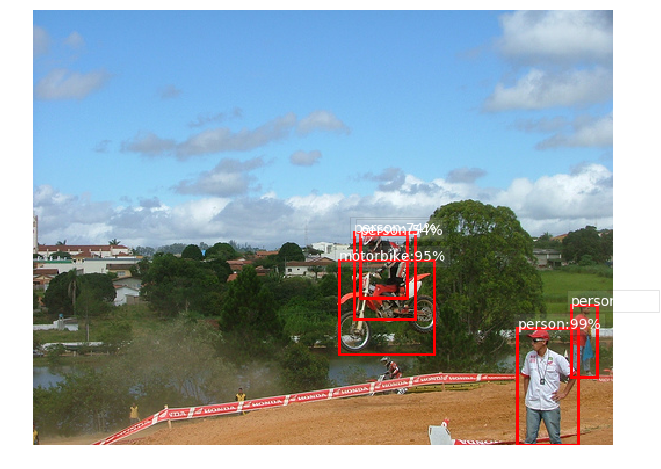

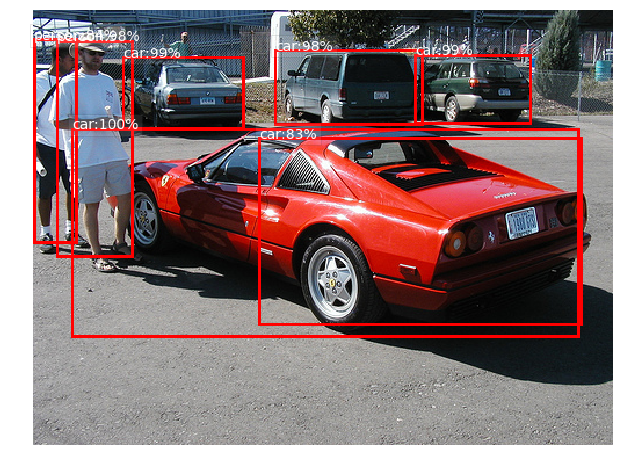

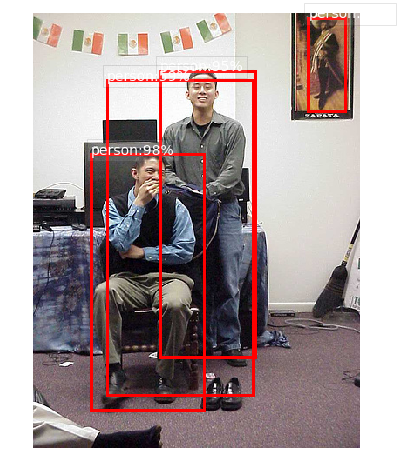

In [63]:
for img_idx in [2, 5, 7, 10]:
  image_path = os.path.join(dataDir, "JPEGImages", "{}.jpg".format(test_split[img_idx]))
  assert os.path.exists(image_path), "Image file was not found."

  image = plt.imread(image_path)
  output_dict = inference_single_image(image, detection_graph)

  threshold = 5e-1
  odList = np.argwhere(output_dict['detection_scores'] > threshold)   # select highly confident
  odList = odList.reshape(-1)

  point_list = []
  class_res = []
  for odidx in odList:
    point_list.append(calculateCoord(image_path, output_dict['detection_boxes'][odidx]))
    class_res.append([\
                      "{}".format(category_index[output_dict['detection_classes'][odidx]]['name']),\
                      "{}".format(str(int(round(output_dict['detection_scores'][odidx]*100, 0))) + "%")\
                      ])

  showImage(image_path, point_list, class_res)